In [1]:
# Importing Libraries
import pandas as pd
import numpy as np 
import matplotlib.pyplot as plt 
import seaborn as sns
import warnings
import time as time # To display taken by your program to run

# What Are Decorators

# A decorator is a design pattern in Python that allows a user to add new functionality to an existing object without modifying its structure. Decorators are usually called before the definition of a function you want to decorate.

# First Class Objects
In Python, functions are first class objects which means that functions in Python can be used or passed as arguments.
Properties of first class functions:

# A function is an instance of the Object type.
You can store the function in a variable.
You can pass the function as a parameter to another function.
You can return the function from a function.
You can store them in data structures such as hash tables, lists, …

In [9]:
# Python program to illustrate functions
# can be treated as objects
def shout(text):
    return text.upper()
 
print(shout('Hello'))
 
yell = shout
 
print(yell('Hello'))
%time

HELLO
HELLO
CPU times: user 5 µs, sys: 2 µs, total: 7 µs
Wall time: 11 µs


# Passing the function as an argument 

In [32]:
type(greet)

function

In [3]:
def shout(text):
    return text.upper()
 
def whisper(text):
    return text.lower()
 
def greet(func):
    # storing the function in a variable
    greeting = func("""Hi, I am created by a function passed as an argument.""")
    print (greeting)
 
greet(shout)
greet(whisper)

HI, I AM CREATED BY A FUNCTION PASSED AS AN ARGUMENT.
hi, i am created by a function passed as an argument.


# Example 3: Returning functions from another function.



In [4]:
def create_adder(x):
    def adder(y):
        return x+y
 
    return adder
 
add_15 = create_adder(15)
 
print(add_15(10))

25


# Decorator can modify the behaviour:  



In [8]:
# defining a decorator
def hello_decorator(func):
 
    # inner1 is a Wrapper function in
    # which the argument is called
     
    # inner function can access the outer local
    # functions like in this case "func"
    def inner1():
        print("Hello, this is before function execution")
 
        # calling the actual function now
        # inside the wrapper function.
        func()
 
        print("This is after function execution")
         
    return inner1
 
 
# defining a function, to be called inside wrapper
def function_to_be_used():
    print("This is inside the function !!")
 
 
# passing 'function_to_be_used' inside the
# decorator to control its behaviour
function_to_be_used = hello_decorator(function_to_be_used)
 
 
# calling the function
function_to_be_used()
%time

Hello, this is before function execution
This is inside the function !!
This is after function execution
CPU times: user 4 µs, sys: 1 µs, total: 5 µs
Wall time: 10 µs


# Let’s see the behaviour of the above code and how it runs step by step when the “function_to_be_used” is called.

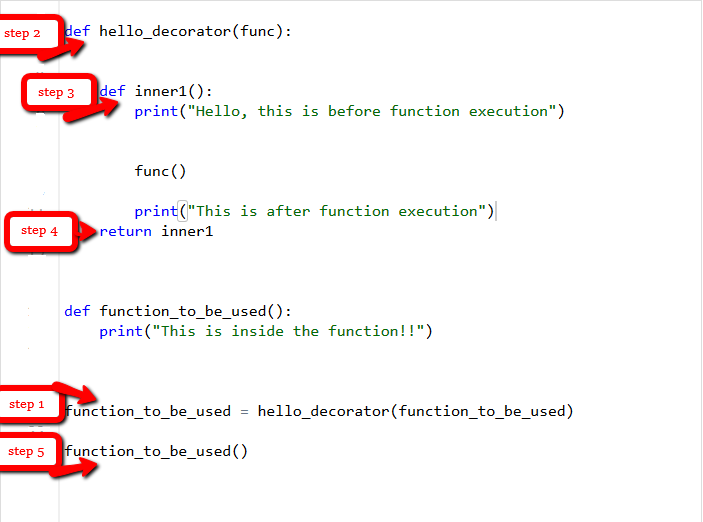

# Step2

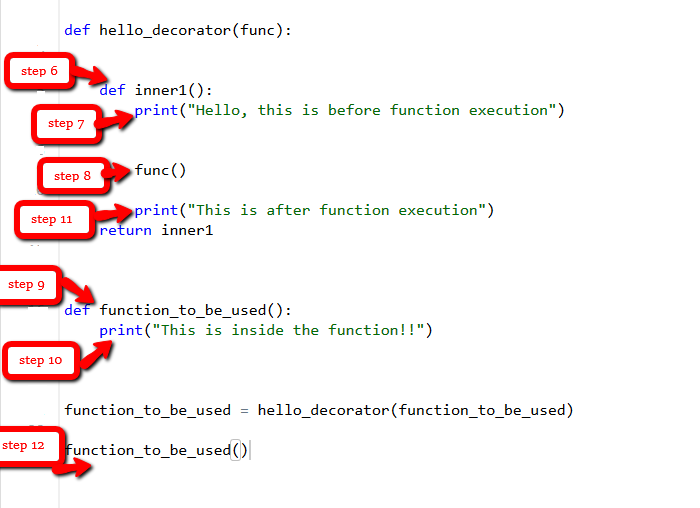

# we can easily find out the execution time of a function using a decorator.




# importing libraries
import time
import math
 
# decorator to calculate duration
# taken by any function.
def calculate_time(func):
     
    # added arguments inside the inner1,
    # if function takes any arguments,
    # can be added like this.
    def inner1(*args, **kwargs):
 
        # storing time before function execution
        begin = time.time()
         
        func(*args, **kwargs)
 
        # storing time after function execution
        end = time.time()
        print("Total time taken in : ", func.__name__, end - begin)
 
    return inner1
 
 
 
# this can be added to any function present,
# in this case to calculate a factorial
@calculate_time
def factorial(num):
 
    # sleep 2 seconds because it takes very less time
    # so that you can see the actual difference
    time.sleep(2)
    print(math.factorial(num))
 
# calling the function.
factorial(10)

# What if a function returns something or an argument is passed to the function?

# In all the above examples the functions didn’t return anything so there wasn’t an issue, but one may need the returned value.

In [10]:
def hello_decorator(func):
    def inner1(*args, **kwargs):
         
        print("before Execution")
         
        # getting the returned value
        returned_value = func(*args, **kwargs)
        print("after Execution")
         
        # returning the value to the original frame
        return returned_value
         
    return inner1
 
 
# adding decorator to the function
@hello_decorator
def sum_two_numbers(a, b):
    print("Inside the function")
    return a + b
 
a, b = 10, 200
 
# getting the value through return of the function
print("Sum =", sum_two_numbers(a, b))

before Execution
Inside the function
after Execution
Sum = 210


# In the above example, you may notice a keen difference in the parameters of the inner function. The inner function takes the argument as *args and **kwargs which means that a tuple of positional arguments or a dictionary of keyword arguments can be passed of any length. This makes it a general decorator that can decorate a function having any number of arguments.



# Chaining Decorators
In simpler terms chaining decorators means decorating a function with multiple decorators.

In [11]:
# code for testing decorator chaining
def decor1(func): # Dec 1
    def inner():
        x = func()
        return x * x
    return inner
 
def decor(func): # DEc2
    def inner():
        x = func()
        return 2 * x
    return inner
 
@decor1
@decor
def num():
    return 10
 
@decor
@decor1
def num2():
    return 10
   
print(num())
print(num2())

400
200


# Generators

# a generator is a function that returns an iterator that produces a sequence of values when iterated over. Generators are useful when we want to produce a large sequence of values, but we don't want to store all of them in memory at once.

# What are Iterators

#  iterators are objects that can be iterated on

In [14]:
# A generator function that yields 1 for first time,
# 2 second time and 3 third time
def simpleGeneratorFun():
    yield 1           
    yield 2           
    yield 3
    yield 4
    yield 5
    
# Driver code to check above generator function
for value in simpleGeneratorFun():
    print(value)

1
2
3
4
5


In [19]:
# A Python program to demonstrate use of
# generator object with next()
 
# A generator function
def simpleGeneratorFun():
    yield 1
    yield 2
    yield 3
    yield 4
    yield 5
  
# x is a generator object
x = simpleGeneratorFun()
 
# Iterating over the generator object using next
print(next(x)) # In Python 3, __next__()
print(next(x))
print(next(x))
print(next(x))
print(next(x))


1
2
3
4
5


# So a generator function returns an generator object that is iterable

# The Fibonacci sequence begins with the following 14 integers: 0, 1, 1, 2, 3, 5, 8, 13, 21, 34, 55, 89, 144, 233 

In [20]:
# A simple generator for Fibonacci Numbers
def fib(limit):
     
    # Initialize first two Fibonacci Numbers
    a, b = 0, 1
 
    # One by one yield next Fibonacci Number
    while a < limit:
        yield a
        a, b = b, a + b
 
# Create a generator object
x = fib(5)
 
# Iterating over the generator object using next
print(next(x)) # In Python 3, __next__()
print(next(x))
print(next(x))
print(next(x))
print(next(x))
 
# Iterating over the generator object using for
# in loop.
print("\nUsing for in loop")
for i in fib(5):
    print(i)

0
1
1
2
3

Using for in loop
0
1
1
2
3


# Python Generators With a Loop


In [28]:
def seq(x):
    for i in range(x):
        yield i
      
range_ = seq(10)
print(next(range_))
print(next(range_))
print(next(range_))
print(next(range_))
print(next(range_))
print(next(range_))
print(next(range_))
print(next(range_))
print(next(range_))
print(next(range_))
print(next(range_))
print(next(range_))
print(next(range_))

0
1
2
3
4
5
6
7
8
9


StopIteration: 

In [31]:
type(range_)

generator

# The function seq will run 10 times, and when seq is called using next for the 11th time, it will show an error StopIteration.

# what is YIeld

# Yield keyword in Python that is used to return from the function without destroying the state of a local variable. We have already discussed how to create a generator function using yield.

In [ ]:
# USES OF Generators

1- Easy To Implement

2- Memory Effecient

3-infinite Sequence 

In [ ]:
def infinite():
    n = 0
    while True:
        yield n
        n += 1
        
for i in infinite():
    if i%4 == 0:
        continue
    elif i == 12:
        break
    else:
        print(i)
%time        

1
2
3
5
6
7
9
10
11
13
14
15
17
18
19
21
22
23
25
26
27
29
30
31
33
34
35
37
38
39
41
42
43
45
46
47
49
50
51
53
54
55
57
58
59
61
62
63
65
66
67
69
70
71
73
74
75
77
78
79
81
82
83
85
86
87
89
90
91
93
94
95
97
98
99
101
102
103
105
106
107
109
110
111
113
114
115
117
118
119
121
122
123
125
126
127
129
130
131
133
134
135
137
138
139
141
142
143
145
146
147
149
150
151
153
154
155
157
158
159
161
162
163
165
166
167
169
170
171
173
174
175
177
178
179
181
182
183
185
186
187
189
190
191
193
194
195
197
198
199
201
202
203
205
206
207
209
210
211
213
214
215
217
218
219
221
222
223
225
226
227
229
230
231
233
234
235
237
238
239
241
242
243
245
246
247
249
250
251
253
254
255
257
258
259
261
262
263
265
266
267
269
270
271
273
274
275
277
278
279
281
282
283
285
286
287
289
290
291
293
294
295
297
298
299
301
302
303
305
306
307
309
310
311
313
314
315
317
318
319
321
322
323
325
326
327
329
330
331
333
334
335
337
338
339
341
342
343
345
346
347
349
350
351
353
354
355
357
358
359
36

# Regular Expression

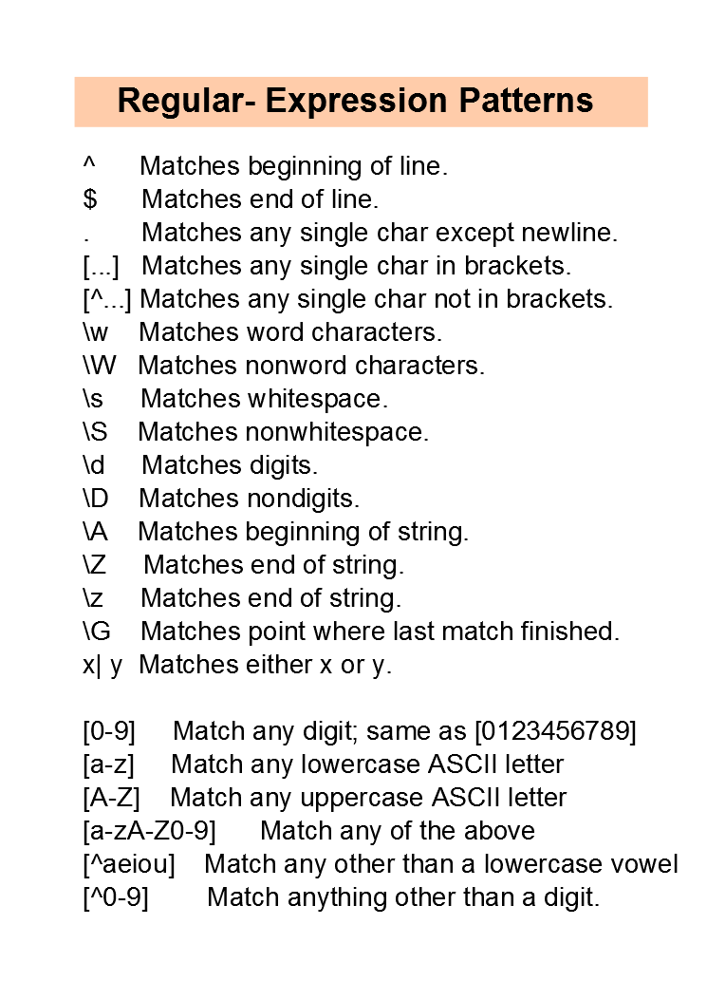

# A Regular Expressions (RegEx) is a special sequence of characters that uses a search pattern to find a string or set of strings. It can detect the presence or absence of a text by matching it with a particular pattern, and also can split a pattern into one or more sub-patterns.

# import re
 
s = 'GeeksforGeeks: A computer science portal for geeks'
 
match = re.search(r'portal', s)
 
print('Start Index:', match.start())
print('End Index:', match.end())

In [2]:
import re # Re denotes to Regular Expressions
 
s = 'GeeksforGeeks: A computer science portal for geeks'
 
match = re.search(r'portal', s)
 
print('Start Index:', match.start())
print('End Index:', match.end())

Start Index: 34
End Index: 40


# The above code gives the starting index and the ending index of the string portal.

# The backslash (\) makes sure that the character is not treated in a special way. This can be considered a way of escaping metacharacters.

In [3]:
import re
 
s = 'geeks.forgeeks'
 
# without using \
match = re.search(r'.', s)
print(match)
 
# using \
match = re.search(r'\.', s)
print(match)

<re.Match object; span=(0, 1), match='g'>
<re.Match object; span=(5, 6), match='.'>


In [6]:
import re
 
string = "The quick brown fox jumps over the lazy dog"
pattern = "[a-d]"
result = re.findall(pattern, string)
 
print(result)

['c', 'b', 'a', 'd']


In [9]:
 # Match strings starting with "The"
regex = r'^The'
strings = ['The quick brown fox', 'The lazy dog', ' quick brown fox']
for string in strings:
    if re.match(regex, string):
        print(f'Matched: {string}')
    else:
        print(f'Not matched: {string}')

Matched: The quick brown fox
Matched: The lazy dog
Not matched:  quick brown fox


In [12]:
string = "Hello World!"
pattern = r"World!$"
 
match = re.search(pattern, string)
if match:
    print("Match found!")
else:
    print("Match not found.")

Match found!


In [13]:
string = "The quick brown fox jumps over the lazy dog."
pattern = r"brown.fox"
 
match = re.search(pattern, string)
if match:
    print("Match found!")
else:
    print("Match not found.")

Match found!


In [14]:

# A Python program to demonstrate working of
# findall()
import re
 
# A sample text string where regular expression
# is searched.
string = """Hello my Number is 123456789 and
            my friend's number is 987654321"""
 
# A sample regular expression to find digits.
regex = '\d+'
 
match = re.findall(regex, string)
print(match)
 
# This example is contributed by Ayush Saluja.

['123456789', '987654321']


In [18]:
# compile() creates regular expression
# character class [a-e],
# which is equivalent to [abcde].
# class [abcde] will match with string with
# 'a', 'b', 'c', 'd', 'e'.
p = re.compile('[a-m]')
 
# findall() searches for the Regular Expression
# and return a list upon finding
print(p.findall("Aye, said Mr. Gibenson Starkcggg"))
# it will findl all between a -e

['e', 'a', 'i', 'd', 'i', 'b', 'e', 'a', 'k', 'c', 'g', 'g', 'g']


# re.search()
This method either returns None (if the pattern doesn’t match), or a re.MatchObject contains information about the matching part of the string. 

In [19]:
# Lets use a regular expression to match a date string
# in the form of Month name followed by day number
regex = r"([a-zA-Z]+) (\d+)"
 
match = re.search(regex, "I was born on June 24")
 
if match != None:
 
    # We reach here when the expression "([a-zA-Z]+) (\d+)"
    # matches the date string.
 
    # This will print [14, 21), since it matches at index 14
    # and ends at 21.
    print ("Match at index %s, %s" % (match.start(), match.end()))
 
    # We use group() method to get all the matches and
    # captured groups. The groups contain the matched values.
    # In particular:
    # match.group(0) always returns the fully matched string
    # match.group(1) match.group(2), ... return the capture
    # groups in order from left to right in the input string
    # match.group() is equivalent to match.group(0)
 
    # So this will print "June 24"
    print ("Full match: %s" % (match.group(0)))
 
    # So this will print "June"
    print ("Month: %s" % (match.group(1)))
 
    # So this will print "24"
    print ("Day: %s" % (match.group(2)))
 
else:
    print ("The regex pattern does not match.")

Match at index 14, 21
Full match: June 24
Month: June
Day: 24


# Match Object

In [31]:
import re

s = "Welcome to Datascience" # WElcome 1 Data2
 
# here x is the match object
res = re.search(r"\W", s)
 
print(res.re)
print(res.string)

re.compile('\\W')
Welcome to Datascience


In [ ]:
##Regular Expresion Ends